# Advanced Lane Finding

Task: Write a software pipeline to identify the lane boundaries in a video.

* Compute the camera calibration matrix & distortion coefficients given a set of chessboard images
* Apply a distortion correction to raw images
* Use color transforms, gradients, etc to create a thresholded binary image
* Apply a perspective transform to rectify binary image (birds-eye view)
* Detect lane pixels & fit to find the lane boundary
* Determine the curvature of the lane & vehicle position with respect to center
* Warp the detected lane boundaries back onto the original image
* Output visual display of the lane boundaries & numerical estimation of lane curvature & vehicle position

### Import libraries

In [42]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import glob

%matplotlib inline

## Camera calibration and distortion correction
Here we compute the camera calibration matrix & destortion coefficients, given a set of chessboard images.

### Get image and object points
First step: Read in calibration images of a chessboard. Use at least 20 images to get a reliable calibration. Each chessboard has 9 x 6 corners to detect.

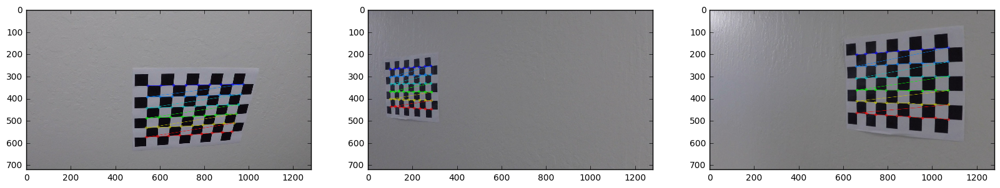

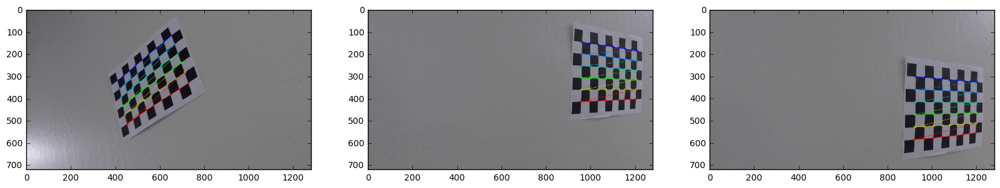

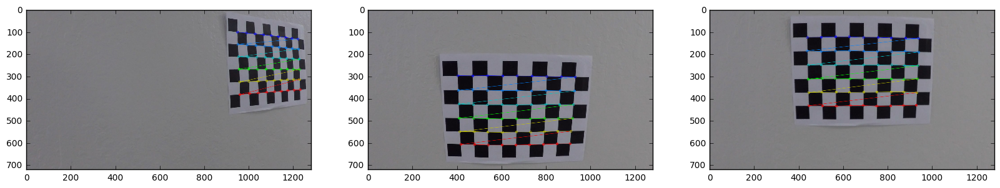

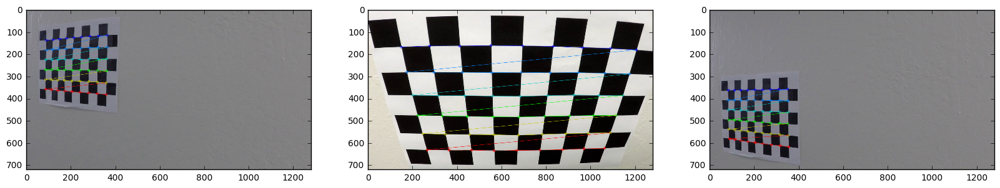

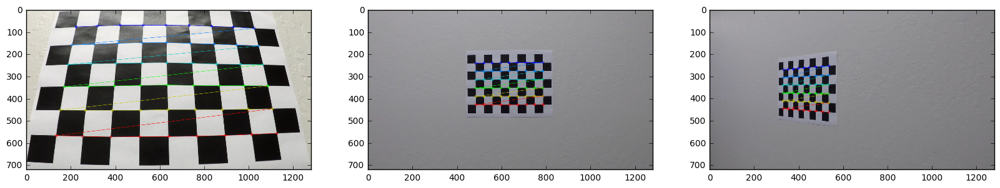

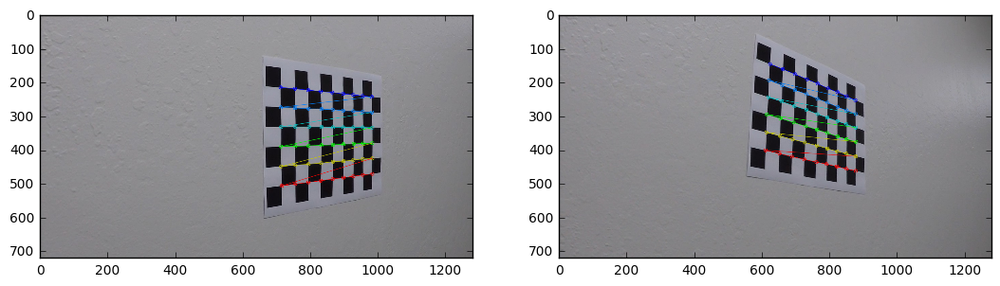

In [41]:
# Read in and make a list of calibration images.
# The glob API helps read in images with a consistent file name
images = glob.glob('camera_cal/calibration*.jpg')

# Map the coordinates of the corners in this 2D image (called its image points)
# to the 3D coordinates of the real, undistorted chessboard corners (called object points).
# Set up two empty arrays to hold these points:

# Arrays to store object points and image points from all the images
objpoints = [] # 3D points in real world space
imgpoints = [] # 2D points in image plane

# Prepare object points, like (0, 0, 0), (1, 0, 0), (2, 0, 0), ..., (8, 5, 0)
objp = np.zeros((9*6, 3), np.float32)
# Z coordinate stays zero, but for x, y generate coordinates:
# mgrid returns the coordinate values for a given grid size. Reshape
# those grids back into two columns
objp[:, :2] = np.mgrid[0:9, 0:6].T.reshape(-1,2) # x, y coordinates

# Loop through all image files, detecting corners and appending points to
# the object and image points arrays.
i = 0
for fname in images:
    # Next, to create the image points, I want to look at the distorted calibration
    # image and detect the corners of the board.
    img = mpimg.imread(fname)

    # Convert image to grayscale (has to be grayscale for next function)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    # Find the chessboard corners
    # Takes in grayscale image along with the dimensions of the chessboard
    # corners (here: 9 x 6)
    ret, corners = cv2.findChessboardCorners(gray, (9, 6), None)

    # If corners are found, add object points, image points
    if ret == True:
        if (i%3 == 0):
            plt.figure(figsize = (20, 20))
        plt.subplot(1,3,i%3+1)
        imgpoints.append(corners)
        # Object points will be the same for all calibration images, since they
        # represent a real chessboard.
        objpoints.append(objp)

        # draw and display the corners
        img = cv2.drawChessboardCorners(img, (9, 6), corners, ret)
        plt.imshow(img)
        if (i%3 == 2):
            plt.show()
        i += 1

### Perform camera calibration

Take image, object points, and image points. Calculate distortion coefficients (dist) and camera matrix (mtx). Perform camera calibration and image distortion correction, and return the undistorted image (undist).

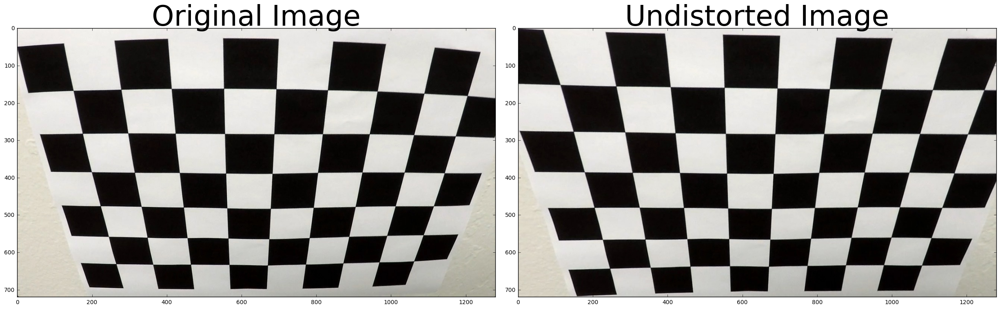

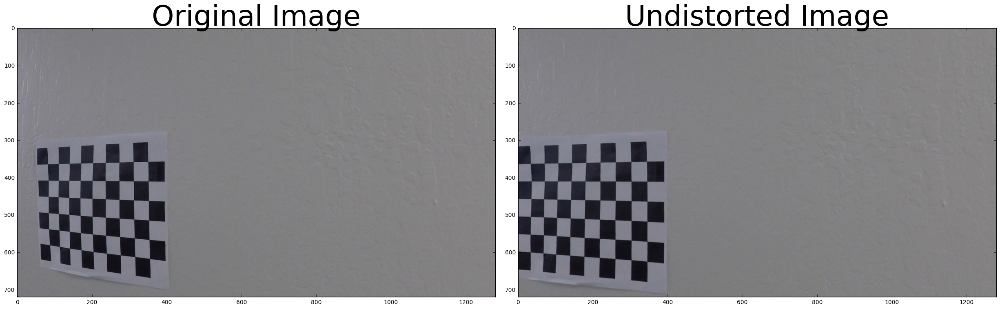

In [48]:
# Calibrates and undistorts images
def cal_undistort(img, objpoints, imgpoints):
    ret, mtx, dist, rvecs, tvecs = cv2.calibrateCamera(objpoints, imgpoints, 
                                                       img.shape[0:2], None, None)
    undist = cv2.undistort(img, mtx, dist, None, mtx)
    return undist

image_file = 'camera_cal/calibration2.jpg'
image = mpimg.imread(image_file)
undistorted = cal_undistort(image, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

image_file = 'camera_cal/calibration20.jpg'
image = mpimg.imread(image_file)
undistorted = cal_undistort(image, objpoints, imgpoints)

f, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 9))
f.tight_layout()
ax1.imshow(image)
ax1.set_title('Original Image', fontsize=50)
ax2.imshow(undistorted)
ax2.set_title('Undistorted Image', fontsize=50)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)

## Use color transforms, gradients, etc to create a thresholded binary image

Now that we have a way to undistort our images, it's time to start detecting lane lines. We will do that with:

* color transforms
* gradients (absolute values, magnitude, direction)

The goal is to detect lane lines, no matter their color (white, yellow), the light situation (shadows, bright day), and the surrounding objects.

In [49]:
# Function applies Sobel x and y, then takes the absolute value of
# the gradient and applies a threshold.
# Note: calling your function with orient='x', thresh_min=5, thresh_max=100
# should produce output like the example image shown above this quiz.
def abs_sobel_thresh(img, orient='x', sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the derivative in x or y given orient = 'x' or 'y'
    if orient == 'x':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    elif orient == 'y':
        sobel = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the derivative or gradient
    abs_sobel = np.absolute(sobel)
    # 4) Scale to 8-bit (0 - 255) then convert to type = np.uint8
    scaled_sobel = np.uint8(255 * abs_sobel / np.max(abs_sobel))
    # 5) Create a mask of 1's where the scaled gradient magnitude
    # is > thresh_min and < thresh_max
    binary_output = np.zeros_like(scaled_sobel)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Function applies Sobel x and y, then computes the magnitude of
# the gradient and applies a threshold.
def mag_thresh(img, sobel_kernel=3, thresh=(0, 255)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Calculate the magnitude
    magn_sobel = np.sqrt(np.power(sobelx, 2) + np.power(sobely, 2))
    # 4) Scale to 8-bit (0 - 255) and convert to type = np.uint8
    scaled_sobel = np.uint8(255 * magn_sobel / np.max(magn_sobel))
    # 5) Create a binary mask where mag thresholds are met
    binary_output = np.zeros_like(scaled_sobel)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output

# Function applies Sobel x and y, then computes the direction of
# the gradient and applies a threshold.
def dir_threshold(img, sobel_kernel=3, thresh=(0, np.pi/2)):
    # 1) Convert to grayscale
    gray = cv2.cvtColor(img, cv2.COLOR_RGB2GRAY)
    # 2) Take the gradient in x and y separately
    sobelx = cv2.Sobel(gray, cv2.CV_64F, 1, 0, ksize=sobel_kernel)
    sobely = cv2.Sobel(gray, cv2.CV_64F, 0, 1, ksize=sobel_kernel)
    # 3) Take the absolute value of the x and y gradients
    abs_sobelx = np.absolute(sobelx)
    abs_sobely = np.absolute(sobely)
    # 4) Use np.arctan2(abs_sobely, abs_sobelx) to calculate the direction of the gradient
    directions = np.arctan2(abs_sobely, abs_sobelx)
    # 5) Create a binary mask where direction thresholds are met
    scaled_sobel = directions
    binary_output = np.zeros_like(scaled_sobel)
    thresh_min = thresh[0]
    thresh_max = thresh[1]
    binary_output[(scaled_sobel >= thresh_min) & (scaled_sobel <= thresh_max)] = 1
    # 6) Return this mask as your binary_output image
    return binary_output


In [105]:
# The S channel is the best solution - it is cleaner than the H channel result
# and a bit better than the R channel or simple grayscaling.
def hls_select(img, thresh=(0, 255)):
    # Convert to HLS color space
    hls = cv2.cvtColor(img, cv2.COLOR_RGB2HLS)
    # Apply a threshold to the S channel
    S = hls[:,:,2]
    binary = np.zeros_like(S)
    binary[(S > thresh[0]) & (S <= thresh[1])] = 1
    # Return a binary image of threshold result
    return binary

# Let's also use the R channel to detect lines
def rgb_select(img, thresh=(0, 255)):
    # Extract the R channel
    R = image[:,:,0]
    # Apply a similar threshold to find lane-line pixels
    binary = np.zeros_like(R)
    binary[((R > thresh[0]) & (R <= thresh[1]))] = 1
    return binary


First, let's use the S channel and R & G channels only to detect lanes

Let's look at the best S thresholds


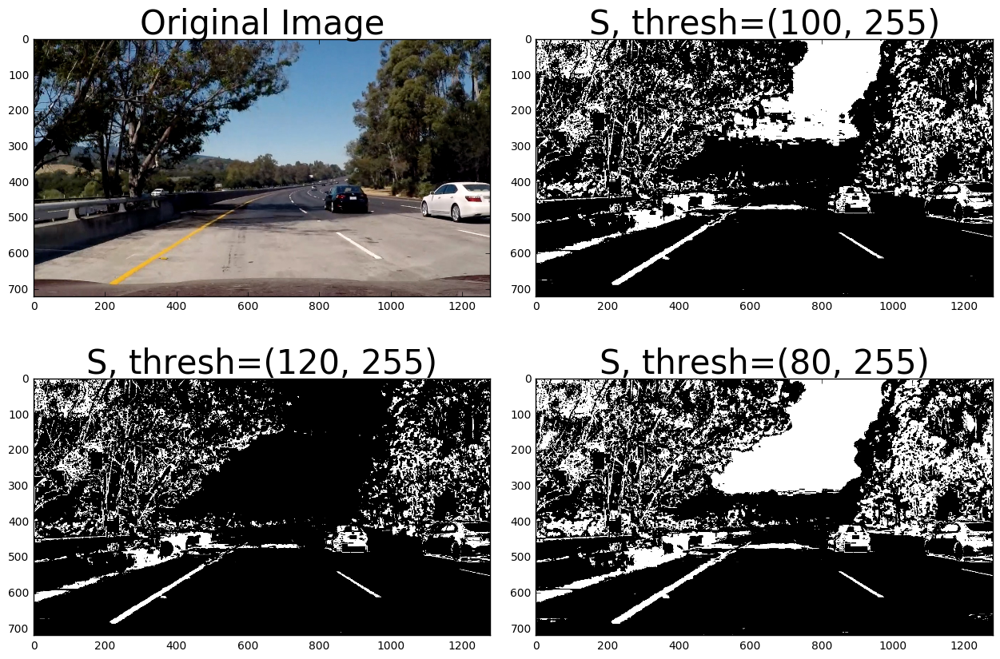

Let's look at the best RG thresholds


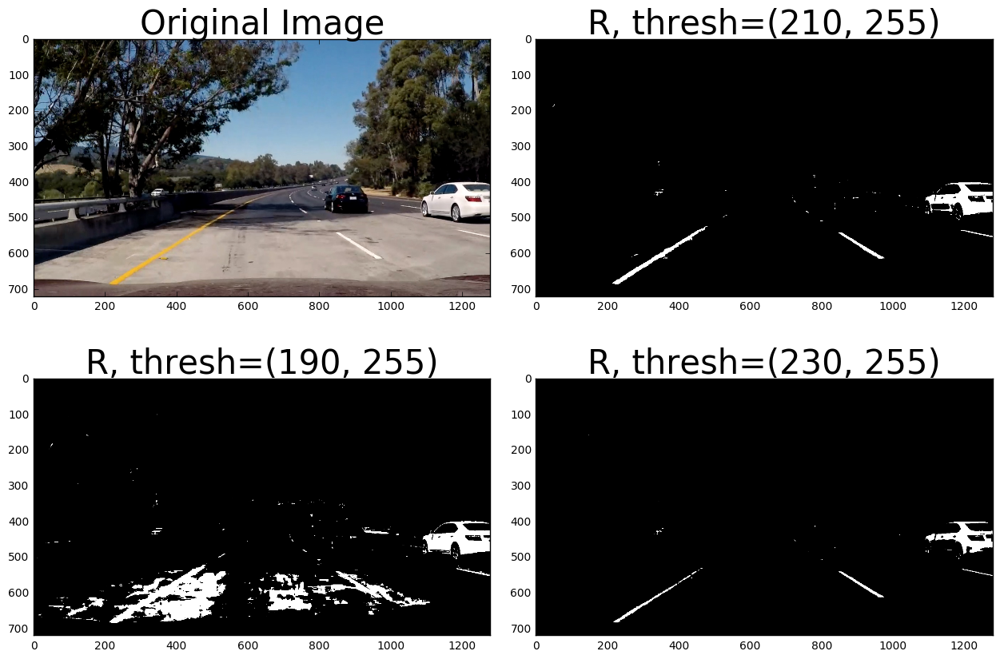

In [117]:
# Let's find out which S thresholds work best by comparing 3 ranges
image = mpimg.imread('test_images/test5.jpg')

print("Let's look at the best S thresholds")
S1 = hls_select(image, thresh=(120, 255))
S2 = hls_select(image, thresh=(100, 255))
S3 = hls_select(image, thresh=(80, 255))

# Plot the result
f, (ax1, ax2) = plt.subplots(2, 2, figsize=(12, 9))
f.tight_layout()
ax1[0].imshow(image)
ax1[0].set_title('Original Image', fontsize=30)
ax2[0].imshow(S1, cmap='gray')
ax2[0].set_title('S, thresh=(120, 255)', fontsize=30)
ax1[1].imshow(S2, cmap='gray')
ax1[1].set_title('S, thresh=(100, 255)', fontsize=30)
ax2[1].imshow(S3, cmap='gray')
ax2[1].set_title('S, thresh=(80, 255)', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

print("Let's look at the best RG thresholds")
R1 = rgb_select(image, thresh=(190, 255))
R2 = rgb_select(image, thresh=(210, 255))
R3 = rgb_select(image, thresh=(230, 255))
# Plot the result
f, (ax1, ax2) = plt.subplots(2, 2, figsize=(12, 9))
f.tight_layout()
ax1[0].imshow(image)
ax1[0].set_title('Original Image', fontsize=30)
ax2[0].imshow(R1, cmap='gray')
ax2[0].set_title('R, thresh=(190, 255)', fontsize=30)
ax1[1].imshow(R2, cmap='gray')
ax1[1].set_title('R, thresh=(210, 255)', fontsize=30)
ax2[1].imshow(R3, cmap='gray')
ax2[1].set_title('R, thresh=(230, 255)', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
plt.show()

The R channel does not really look promising here. I'll stick with only using the S channel for now, using thresholds between 80 and 255.

Let's move on to using and adding the gradients as line detectors.

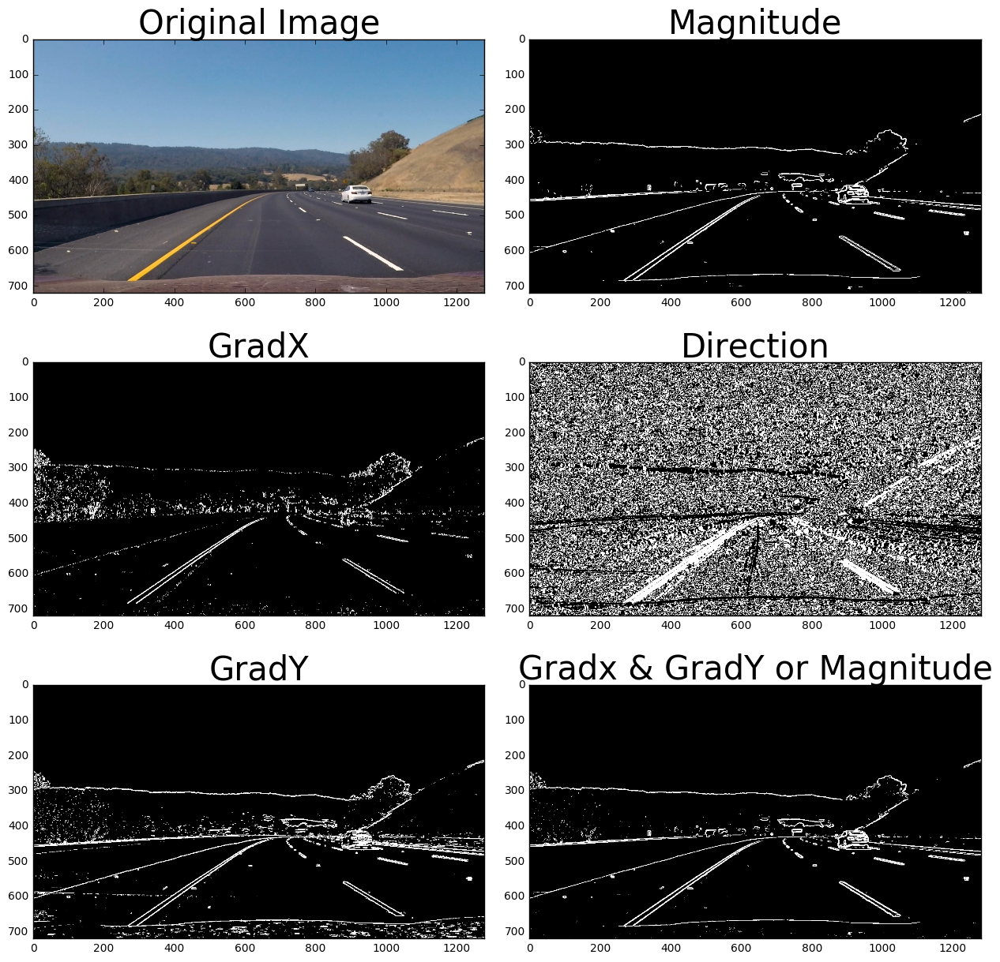

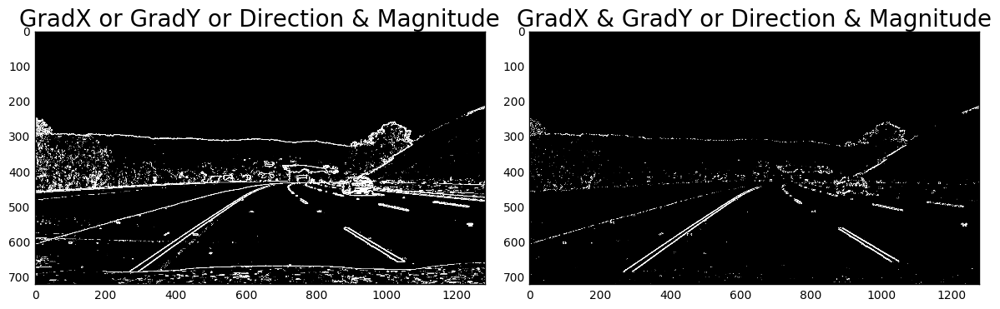

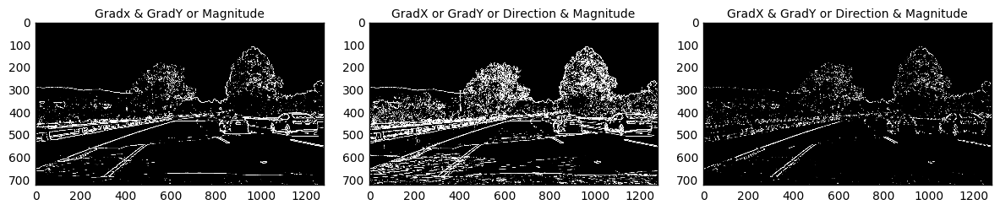

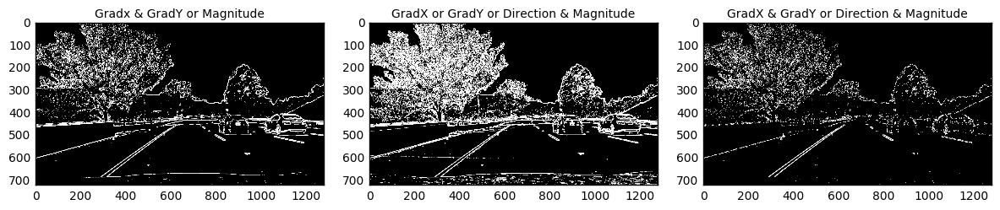

In [188]:
# Choose a Sobel kernel size
ksize = 3 # Choose a larger odd number to smooth gradient measurements

image = mpimg.imread('test_images/test3.jpg')
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
mag_binary = mag_thresh(image, sobel_kernel=7, thresh=(50, 200))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.6, 1.3))

combined = np.zeros_like(dir_binary)
combined[(gradx == 1) & (grady == 1) | (mag_binary == 1)] = 1

# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(3, 2, figsize=(12, 9))
f.tight_layout()
ax1[0].imshow(image)
ax1[0].set_title('Original Image', fontsize=30)
ax2[0].imshow(gradx, cmap='gray')
ax2[0].set_title('GradX', fontsize=30)
ax3[0].imshow(grady, cmap='gray')
ax3[0].set_title('GradY', fontsize=30)
ax1[1].imshow(mag_binary, cmap='gray')
ax1[1].set_title('Magnitude', fontsize=30)
ax2[1].imshow(dir_binary, cmap='gray')
ax2[1].set_title('Direction', fontsize=30)
ax3[1].imshow(combined, cmap='gray')
ax3[1].set_title('Gradx & GradY or Magnitude', fontsize=30)
plt.subplots_adjust(left=0., right=1, top=1.3, bottom=0.)
plt.show()

combined2 = np.zeros_like(dir_binary)
combined2[((gradx == 1) | (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
combined3 = np.zeros_like(dir_binary)
combined3[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
# Plot the result
f, (ax1, ax2) = plt.subplots(1, 2, figsize=(12, 9))
f.tight_layout()
ax1.imshow(combined2, cmap='gray')
ax1.set_title('GradX or GradY or Direction & Magnitude', fontsize=20)
ax2.imshow(combined3, cmap='gray')
ax2.set_title('GradX & GradY or Direction & Magnitude', fontsize=20)
plt.show()

# Test it on one more image
image = mpimg.imread('test_images/test4.jpg')
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
mag_binary = mag_thresh(image, sobel_kernel=7, thresh=(50, 200))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.6, 1.3))

combined = np.zeros_like(dir_binary)
combined[(gradx == 1) & (grady == 1) | (mag_binary == 1)] = 1
combined2 = np.zeros_like(dir_binary)
combined2[((gradx == 1) | (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
combined3 = np.zeros_like(dir_binary)
combined3[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 9))
f.tight_layout()
ax1.imshow(combined, cmap='gray')
ax1.set_title('Gradx & GradY or Magnitude', fontsize=10)
ax2.imshow(combined2, cmap='gray')
ax2.set_title('GradX or GradY or Direction & Magnitude', fontsize=10)
ax3.imshow(combined3, cmap='gray')
ax3.set_title('GradX & GradY or Direction & Magnitude', fontsize=10)
plt.show()


# Test it on one more image
image = mpimg.imread('test_images/test6.jpg')
gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150))
grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
mag_binary = mag_thresh(image, sobel_kernel=7, thresh=(50, 200))
dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.6, 1.3))

combined = np.zeros_like(dir_binary)
combined[(gradx == 1) & (grady == 1) | (mag_binary == 1)] = 1
combined2 = np.zeros_like(dir_binary)
combined2[((gradx == 1) | (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
combined3 = np.zeros_like(dir_binary)
combined3[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1
# Plot the result
f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12, 9))
f.tight_layout()
ax1.imshow(combined, cmap='gray')
ax1.set_title('Gradx & GradY or Magnitude', fontsize=10)
ax2.imshow(combined2, cmap='gray')
ax2.set_title('GradX or GradY or Direction & Magnitude', fontsize=10)
ax3.imshow(combined3, cmap='gray')
ax3.set_title('GradX & GradY or Direction & Magnitude', fontsize=10)
plt.show()


What I see above is that "GradX or GradY or Direction & Magnitude" is great at picking up lanes far into the horizon. But in more noisy images, it's also great at picking up shadow, so I don't want to use that.

The performance of "GradX & GradY or Magnitude" is slightly better than the performance of "GradX & GradY or Direction & Magnitude" at picking up lanes, but it is also better at picking up noise. That's why I conclude that I'll use "GradX & GradY or Direction & Magnitude" in the following.

Let's merge the S channel and "GradX & GradY or Direction & Magnitude" now.

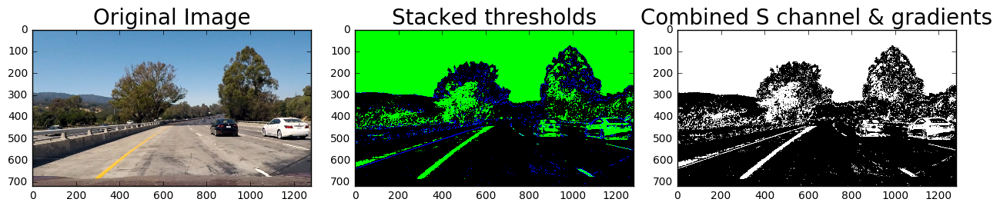

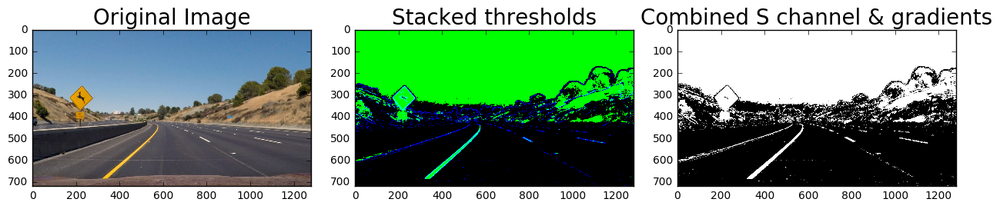

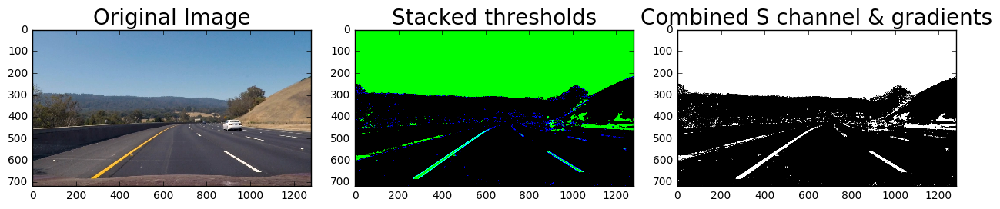

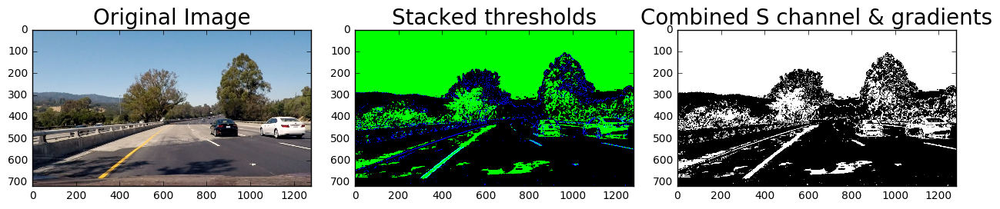

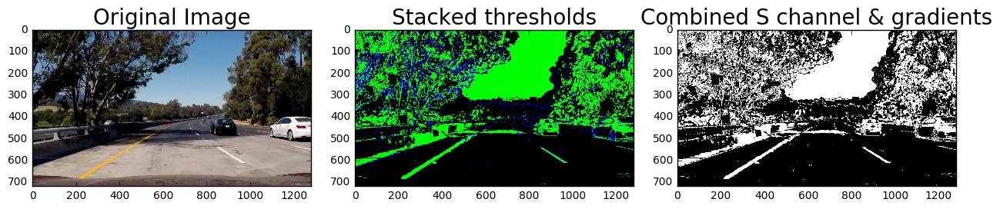

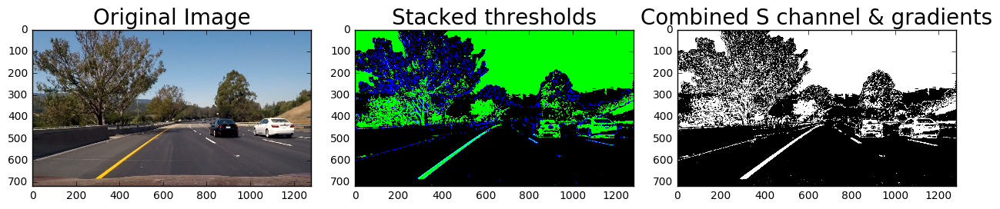

In [236]:
# Let's find out which S thresholds work best by comparing 3 ranges
image_paths = glob.glob('test_images/test*.jpg')

# Merges S channel and "GradX & GradY or Direction & Magnitude" filters
def filter_lanes(img):
    S = hls_select(image, thresh=(80, 255))

    ksize = 3 # Choose a larger odd number to smooth gradient measurements
    gradx = abs_sobel_thresh(image, orient='x', sobel_kernel=ksize, thresh=(20, 150))
    grady = abs_sobel_thresh(image, orient='y', sobel_kernel=ksize, thresh=(20, 255))
    mag_binary = mag_thresh(image, sobel_kernel=7, thresh=(50, 200))
    dir_binary = dir_threshold(image, sobel_kernel=15, thresh=(0.6, 1.3))

    combined_gradient = np.zeros_like(dir_binary)
    combined_gradient[((gradx == 1) & (grady == 1)) | ((dir_binary == 1) & (mag_binary == 1))] = 1

    # Stack each channel to view their individual contributions in green and blue respectively
    # This returns a stack of the two binary images, whose components you can see as different colors
    color_binary = np.dstack(( np.zeros_like(S), S, combined_gradient))

    # Combine the two binary thresholds
    combined_binary = np.zeros_like(S)
    combined_binary[(S == 1) | (combined_gradient == 1)] = 1
    
    return combined_binary, color_binary
    

for img_path in image_paths:
    image = mpimg.imread(img_path)
    combined_binary, color_binary = filter_lanes(image)

    # Plot the result
    f, (ax1, ax2, ax3) = plt.subplots(1, 3, figsize=(12,9))
    f.tight_layout()
    ax1.imshow(image)
    ax1.set_title('Original Image', fontsize=20)
    ax2.imshow(color_binary, cmap='gray')
    ax2.set_title('Stacked thresholds', fontsize=20)
    ax3.imshow(combined_binary, cmap='gray')
    ax3.set_title('Combined S channel & gradients', fontsize=20)
    plt.subplots_adjust(left=0., right=1, top=0.9, bottom=0.)
    plt.show()

## Apply perspective transform to rectify binary image (bird's eye view)

In order to perform the perspective transform, we need to pick source points (from the cameras view) and the corresponding desired points in the bird view. This can be done by taking an image where the lanes are straight, and manually choose the points from the original and on the original destination image that does not exist yet. These points will define the perspective transform.

[[300, 720], [300, 0], [980, 0], [980, 720]]
[[300, 720], [300, 0], [980, 0], [980, 720]]


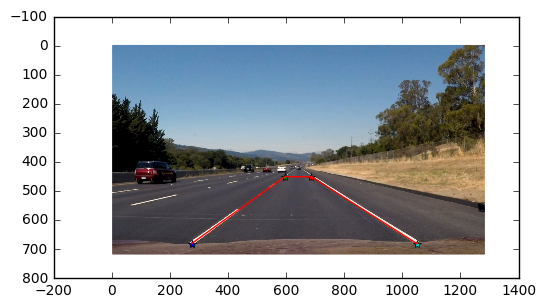

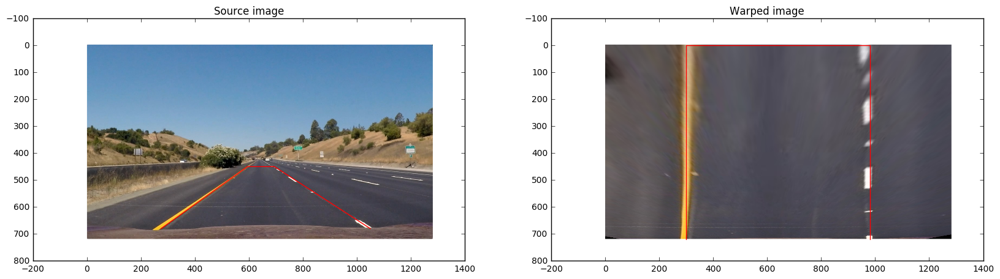

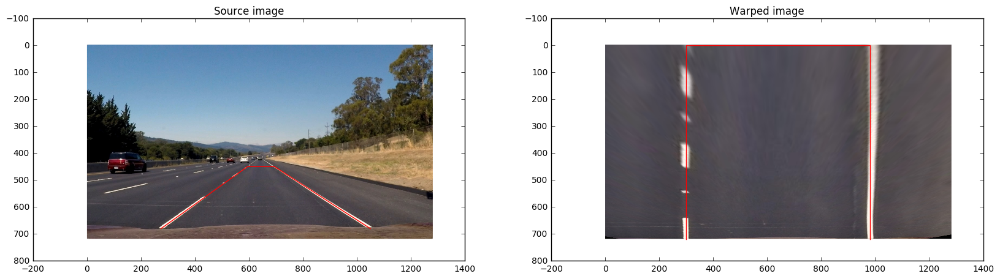

In [235]:
image = mpimg.imread('test_images/straight_lines2.jpg')
plt.imshow(image)

# source image points
plt.plot(275, 680, '*') # bottom left
plt.plot(595, 450, '*') # top left
plt.plot(687, 450, '*') # top right
plt.plot(1050, 680, '*') # bottom right

points = [[275, 680], [595, 450], [687, 450], [1050, 680]]
x = [p[0] for p in points]
y = [p[1] for p in points]
plt.plot(x, y, color='red')
plt.show

# Define perspective transform function 
def warp(img):
    # Define calibration box in source (original) and destination (desired
    # or warped) coordinates
    img_size = (img.shape[1], img.shape[0])

    src = np.float32([[275, 680],
                    [595, 450],
                    [687, 450],
                    [1050, 680]])
    width = img_size[0]
    height = img_size[1]
    offset = 300
    dst = np.float32([[offset, height],
                    [offset, 0],
                    [width - offset, 0],
                    [width - offset, height]])
    
    # Compute the perspective transform, M, given source and destination points
    # Takes in our four source points, and our four destination points
    # And it returns the mapping as a perspective matrix.
    M = cv2.getPerspectiveTransform(src, dst)

    # Create warped image - uses linear interpolation
    # How to interpolate points: just fill in missing points as it warps the image
    # here: linear interpolation
    # Warp an image using the perspective transform, M
    warped = cv2.warpPerspective(img, M, img_size, flags=cv2.INTER_LINEAR)

    return warped


image_paths = glob.glob('test_images/straight_lines*.jpg')

for img_path in image_paths:
    image = mpimg.imread(img_path)
    warped_im = warp(image)

    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))

    ax1.set_title('Source image')
    ax1.imshow(image)
    
    points = [[275, 680], [595, 450], [695, 450], [1050, 680]]
    x = [p[0] for p in points]
    y = [p[1] for p in points]
    ax1.plot(x, y, color='red')
    
    ax2.set_title('Warped image')
    ax2.imshow(warped_im)
    
    img_size = (image.shape[1], image.shape[0])
    width = img_size[0]
    height = img_size[1]
    offset = 300
    points = [[offset, height],
        [offset, 0],
        [width - offset, 0],
        [width - offset, height]]
    print(p)
    x = [p[0] for p in points]
    y = [p[1] for p in points]
    ax2.plot(x, y, color='red')

This looks about right! Let's see how that looks like for binary images.

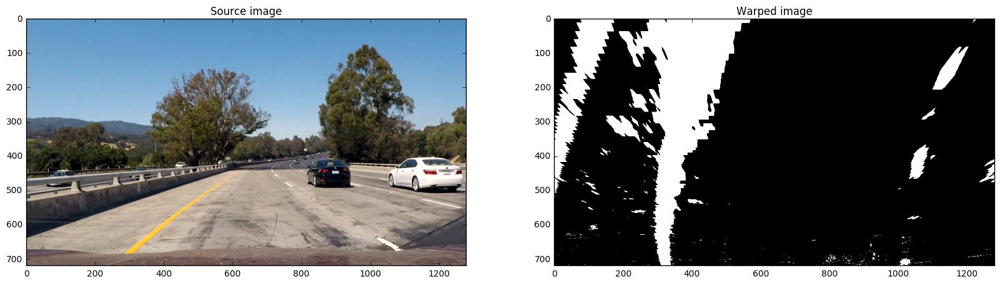

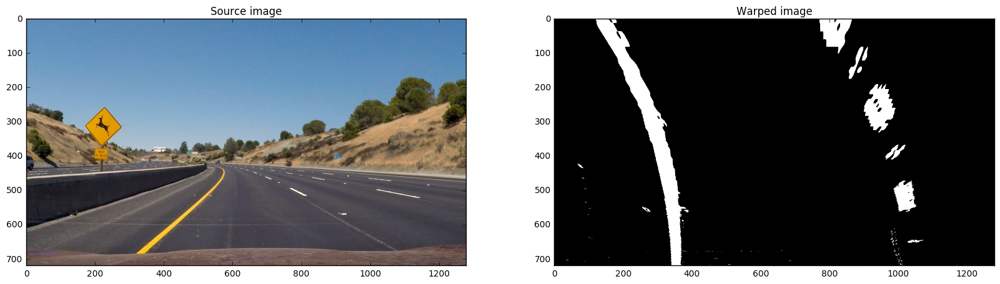

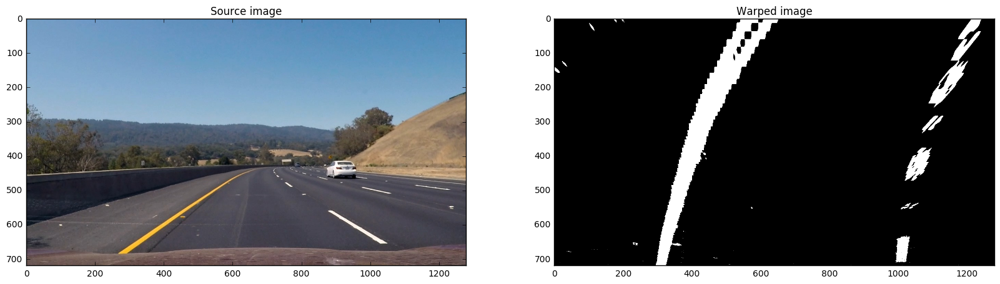

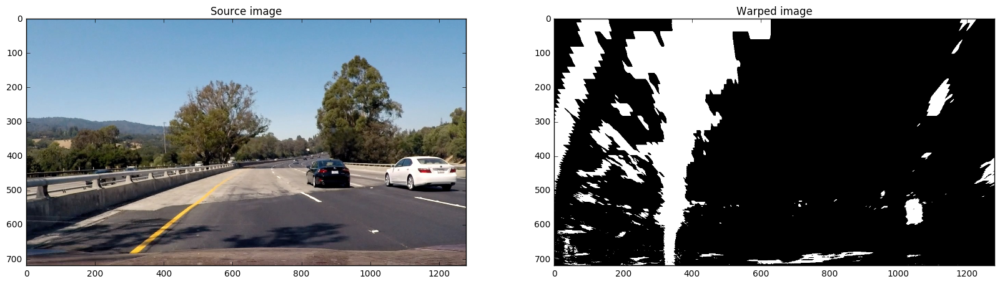

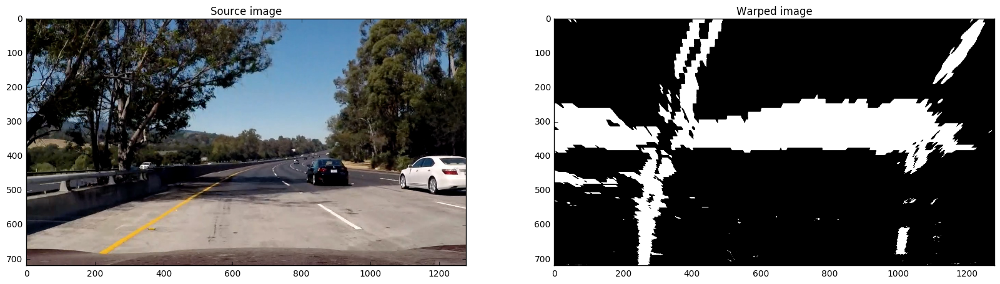

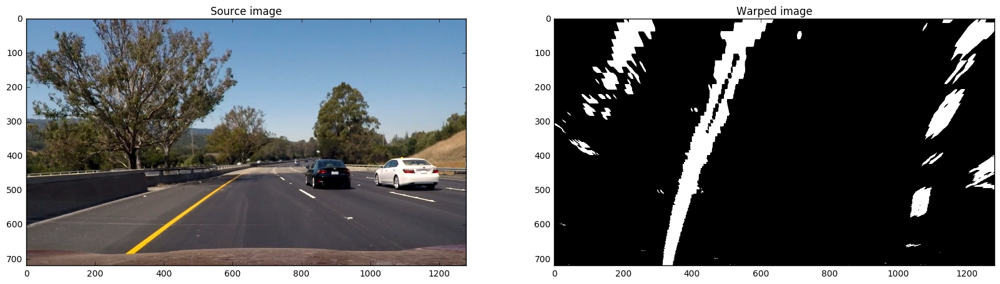

In [240]:
image_paths = glob.glob('test_images/test*.jpg')

for img_path in image_paths:
    image = mpimg.imread(img_path)
    combined_binary, color_binary = filter_lanes(image)
    warped_im = warp(combined_binary)
    # Visualize undistortion
    f, (ax1, ax2) = plt.subplots(1, 2, figsize=(20, 10))
    ax1.set_title('Source image')
    ax1.imshow(image)
    ax2.set_title('Warped image')
    ax2.imshow(warped_im, cmap='gray')